In [141]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib as mpl
import scipy.ndimage as ndimage
import matplotlib.ticker as plticker
import scipy.spatial.distance as dist
mpl.rcParams['figure.dpi'] = 300

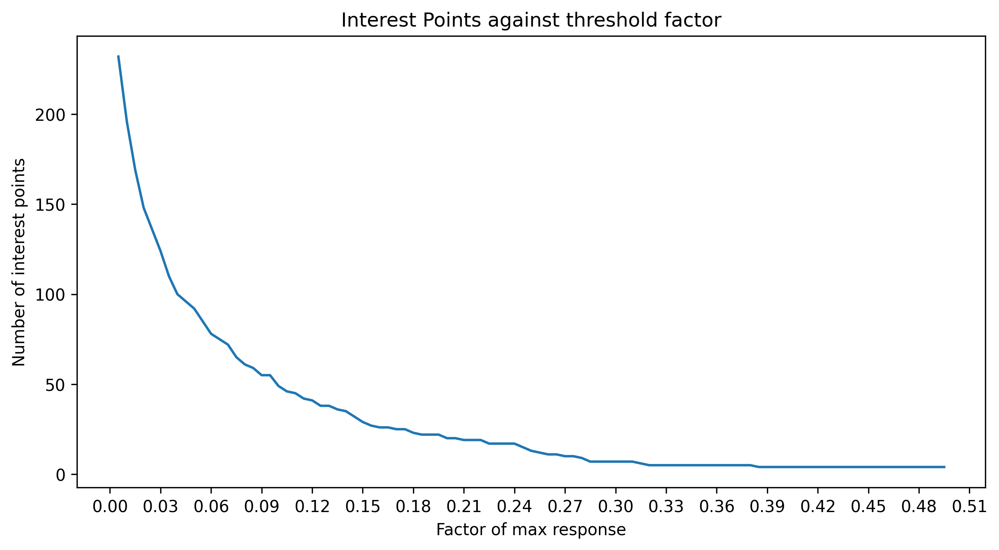

In [142]:
def padArray(arr, vPadSize, hPadSize):
    (rows, columns) = arr.shape
    # Pad array by creating array with all zeroes
    padded = np.zeros(shape=(rows + vPadSize * 2, columns + hPadSize * 2))
    # Then copy values from original into the slice where it should be in the padded arr
    np.copyto(padded[vPadSize:rows + vPadSize, hPadSize:columns + hPadSize], arr)
    return padded

def nonMaximaSupress(img, size):
    halfSize = (size - 1) // 2
    (rows, columns) = img.shape
    result = np.array(img)
    padded = np.pad(img, pad_width=((halfSize, halfSize), (halfSize, halfSize)), mode="reflect")
    for rowI in range(halfSize, rows + halfSize):
        for colI in range(halfSize, columns + halfSize):
            val = padded[rowI][colI] 
            neighbourhood = padded[rowI - halfSize : rowI + halfSize + 1, colI - halfSize : colI + halfSize + 1]
            if val < np.max(neighbourhood):
                result[rowI - halfSize][colI - halfSize] = 0
            if val < 0:
                result[rowI - halfSize][colI - halfSize] = 0
    return result


def getKp(r, angles, thresholdFactor):
    threshold = np.max(r) * thresholdFactor
    thresholded =  (r > threshold) * 1
    temp =  np.where(thresholded == 1)
    kps = []
    for i in range(len(temp[0])):
        x = temp[1][i]
        y = temp[0][i]
        # feature size is 5 because we used gaussian window func of 5x5
        kp = cv2.KeyPoint(float(x), float(y), 5, angles[y][x], response=r[y][x])
        kps.append(kp)
    return kps
    
def HarrisPointsDetector(image, k, sigma, thresholdFactor):
    Ix = cv2.Sobel(image, cv2.CV_32F, 1, 0, ksize=3, delta=0, scale=1, borderType=cv2.BORDER_REFLECT)
    Iy = cv2.Sobel(image, cv2.CV_32F, 0, 1, ksize=3, delta=0, scale=1, borderType=cv2.BORDER_REFLECT)
    IxSq = Ix ** 2
    IySq = Iy ** 2
    gIxSquared = cv2.GaussianBlur(IxSq, (5, 5), sigmaX=sigma, sigmaY=sigma, borderType=cv2.BORDER_REFLECT)
    gIySquared = cv2.GaussianBlur(IySq, (5, 5), sigmaX=sigma, sigmaY=sigma, borderType=cv2.BORDER_REFLECT)
    gIxy = cv2.GaussianBlur(Ix * Iy, (5, 5), sigmaX=sigma, sigmaY=sigma, borderType=cv2.BORDER_REFLECT)
    detM = (gIxSquared * gIySquared) - (gIxy * gIxy)
    traceM = gIxSquared + gIySquared
    R = detM - k * (traceM ** 2)
    angles = cv2.phase(Ix, Iy, angleInDegrees=True)
    # Non-maxima suppress
    R = nonMaximaSupress(R, 7)
    return R, angles, getKp(R, angles, thresholdFactor)
    


def testThresholds(img):
    
    factor = 0.005
    increment = 0.005
    x = []
    y = []
    r, angles, kp = HarrisPointsDetector(img, 0.05, 0.5, factor)
    while factor <= 0.5:
        
        x.append(factor)
        numPoints = len(getKp(r, angles, factor))
        y.append(numPoints)
        factor += increment
    fig, ax = plt.subplots(figsize =(10, 5), facecolor="white")
    ax.plot(x, y)
    loc = plticker.MultipleLocator(base=0.03) # this locator puts ticks at regular intervals
    ax.xaxis.set_major_locator(loc)
    plt.title("Interest Points against threshold factor")
    ax.set_xlabel("Factor of max response")
    ax.set_ylabel("Number of interest points")
    plt.show()

refImage = cv2.imread("bernieSanders.jpg", cv2.IMREAD_GRAYSCALE)
small = cv2.resize(refImage, (512, 512), interpolation=cv2.INTER_CUBIC)
# small = refImage
testThresholds(small)


## How did you choose the threshold value to find the strongest interest points? 
Experimentally chose between 0.02 and 0.09, looking at feature matched between custom harris and default harris keypoints, to get the best number of matches. 0.03 seems to be the best.

# Reference Features Detection Results

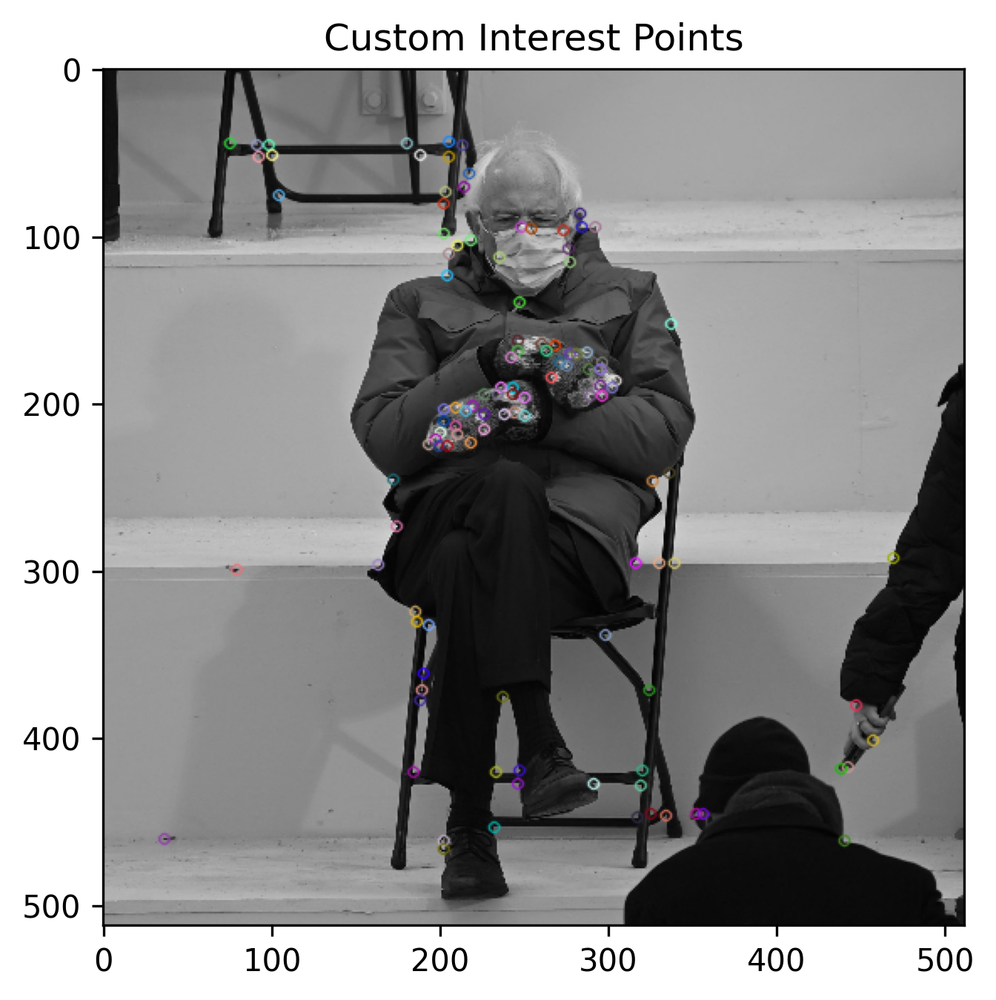

In [143]:
def createDefaultOrb(img, scoreType):
    orb = cv2.ORB_create(scoreType=scoreType, patchSize=5)
    kps = orb.detect(img)
    return featureDescriptor(img, kps)

def featureDescriptor(img, kps):
    orb = cv2.ORB_create(patchSize=5)
    return orb.compute(img, kps)

def createCustomOrb(img):
    thresholdFactor = 0.03
    kps = HarrisPointsDetector(img, 0.05, 0.5, thresholdFactor)[2]
    return featureDescriptor(img, kps)

customKps, customDescriptors = createCustomOrb(small)
fig, ax = plt.subplots(figsize =(5, 5), facecolor="white")
showCustom = cv2.drawKeypoints(small, customKps, None)
plt.title("Custom Interest Points")
plt.imshow(showCustom, aspect='auto')
plt.show()


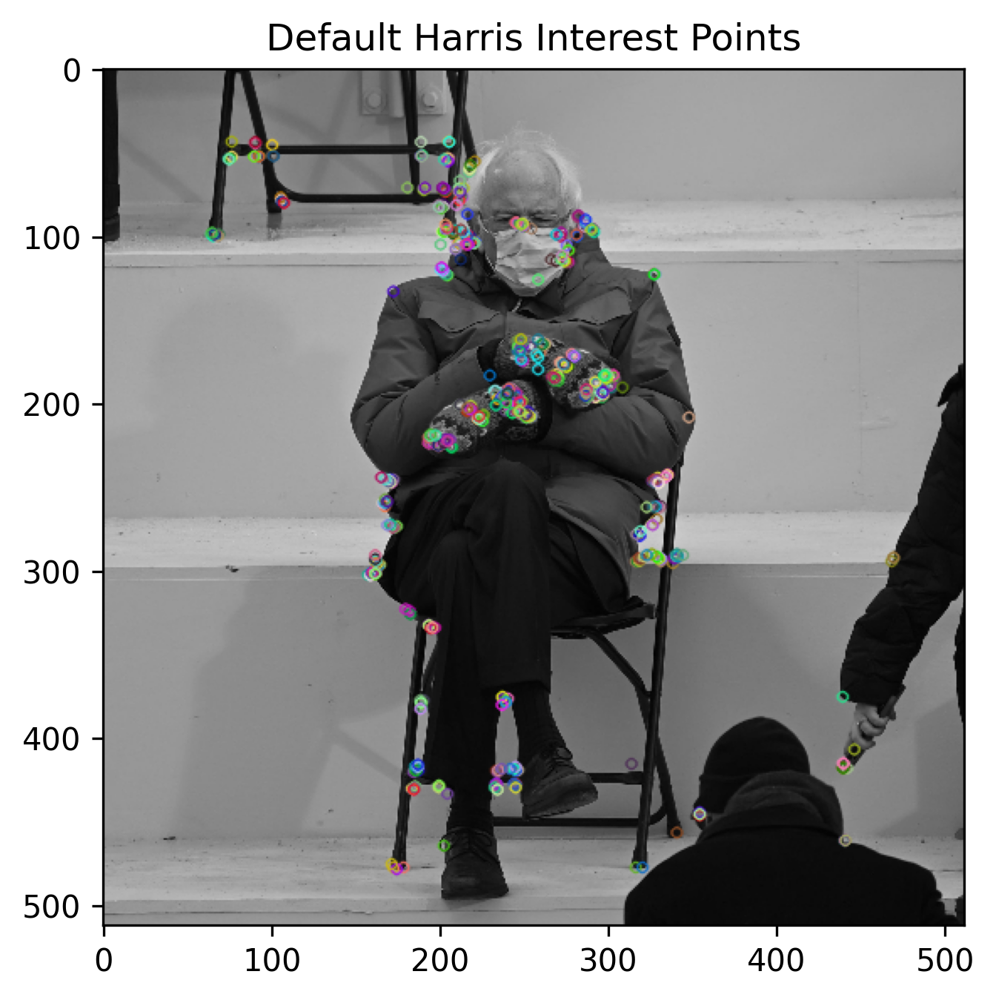

In [144]:
defaultHarrisKps, defaultHarrisDescriptors = createDefaultOrb(small, cv2.ORB_HARRIS_SCORE)
fig, ax = plt.subplots(figsize =(5, 5), facecolor="white")
showDefault = cv2.drawKeypoints(small, defaultHarrisKps, None)

plt.title("Default Harris Interest Points")
plt.imshow(showDefault, aspect='auto')
plt.show()

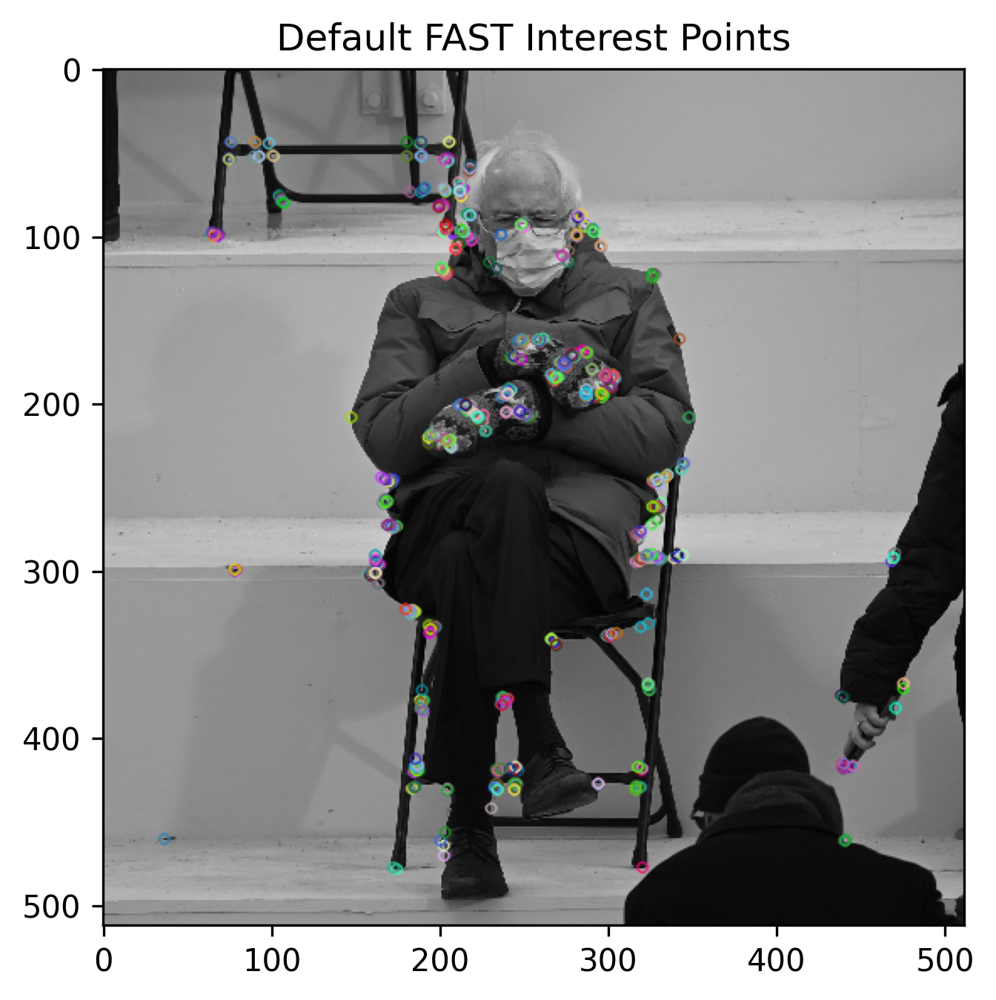

In [145]:
defaultFastKps, defaultFastDescriptors = createDefaultOrb(small, cv2.ORB_FAST_SCORE)
fig, ax = plt.subplots(figsize =(5, 5), facecolor="white")
showDefault = cv2.drawKeypoints(small, defaultFastKps, None)
plt.title("Default FAST Interest Points")
plt.imshow(showDefault, aspect='auto')
plt.show()

In [146]:
def calc_ssd(descriptor1, descriptor2):
    return np.sum((descriptor1 - descriptor2) ** 2)

def calc_distances(feat1, feat2):
    distances = np.zeros((feat1.shape[0], feat2.shape[0]))
    for i in range(len(feat1)):
        for j in range(len(feat2)):
            distances[i][j] = calc_ssd(feat1[i], feat2[j])
    return distances

def SSDFeatureMatcher(feat1, feat2):
    distances = calc_distances(feat1, feat2)
    matches = []
    for i in range(len(feat1)):
        curDistances = distances[i]
        bestMatchI = np.argmin(curDistances)
        match = cv2.DMatch(i, bestMatchI, curDistances[bestMatchI])
        matches.append(match)
    return matches

def RatioFeatureMatcher(feat1, feat2, ratioThreshold):
    distances = calc_distances(feat1, feat2)
    matches = []
    droppedCnt = 0
    for i in range(len(feat1)):
        curDistances = distances[i]
        sortedDist = curDistances.argsort()[:2]
        # make sure that both are not completely 0 otherwise errors of division by 0
        firstBest = max(curDistances[sortedDist[0]], 0.000000001)
        secondBest = max(curDistances[sortedDist[1]], 0.000000001)
        ratio = firstBest / secondBest
        if ratio >= ratioThreshold:
            droppedCnt += 1
            continue
        bestMatchI = sortedDist[0]
        match = cv2.DMatch(i, bestMatchI, curDistances[bestMatchI])
        matches.append(match)
    print(f"{droppedCnt} ambiguous feature matches dropped")
    return matches

# Benchmark Matches

16 ambiguous feature matches dropped


<function matplotlib.pyplot.show(close=None, block=None)>

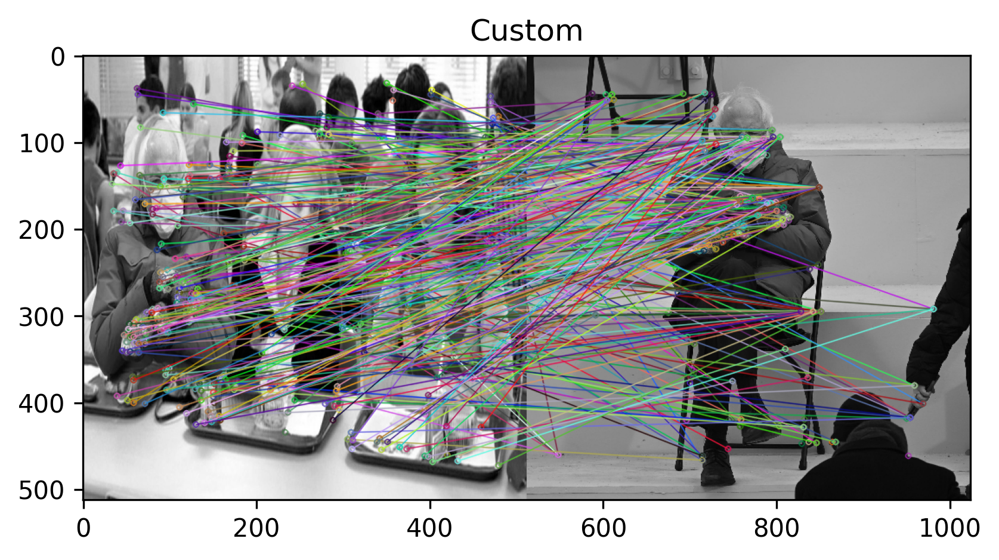

In [147]:
query = cv2.imread("images/bernieShoolLunch.jpeg", cv2.IMREAD_GRAYSCALE)
querySmall = cv2.resize(query, (512, 512), interpolation=cv2.INTER_CUBIC)
# querySmall = query
queryCustomKps, queryCustomDescriptors = createCustomOrb(querySmall)
matches = RatioFeatureMatcher(queryCustomDescriptors, customDescriptors, 0.98)
img = cv2.drawMatches(querySmall, queryCustomKps, small, customKps, matches, None)
plt.title("Custom")
plt.imshow(img)
plt.show

62 ambiguous feature matches dropped


<function matplotlib.pyplot.show(close=None, block=None)>

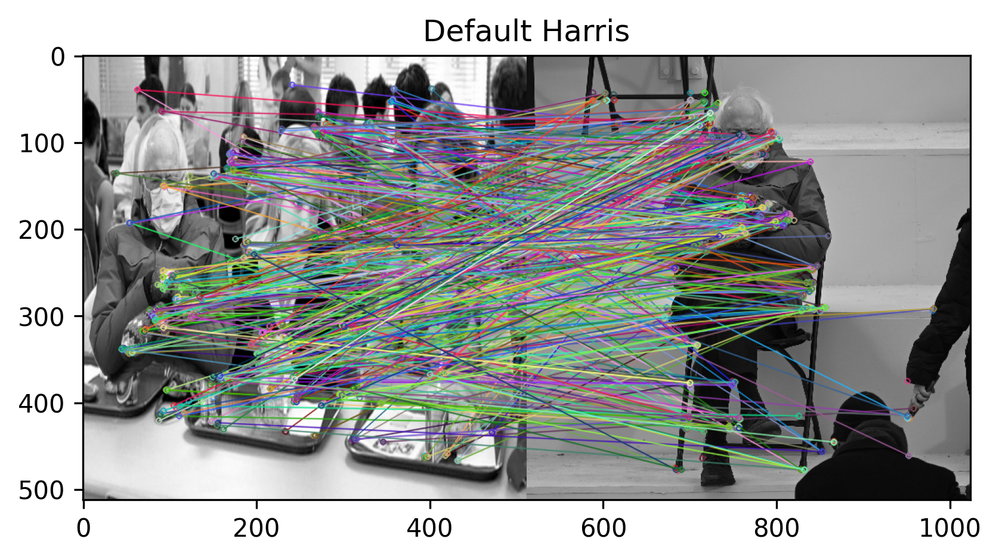

In [148]:
queryCustomKps, queryCustomDescriptors = createDefaultOrb(querySmall, cv2.ORB_HARRIS_SCORE)
matches = RatioFeatureMatcher(queryCustomDescriptors, defaultHarrisDescriptors, 0.98)
img = cv2.drawMatches(querySmall, queryCustomKps, small, defaultHarrisKps, matches, None)
plt.title("Default Harris")
plt.imshow(img)
plt.show

72 ambiguous feature matches dropped


<function matplotlib.pyplot.show(close=None, block=None)>

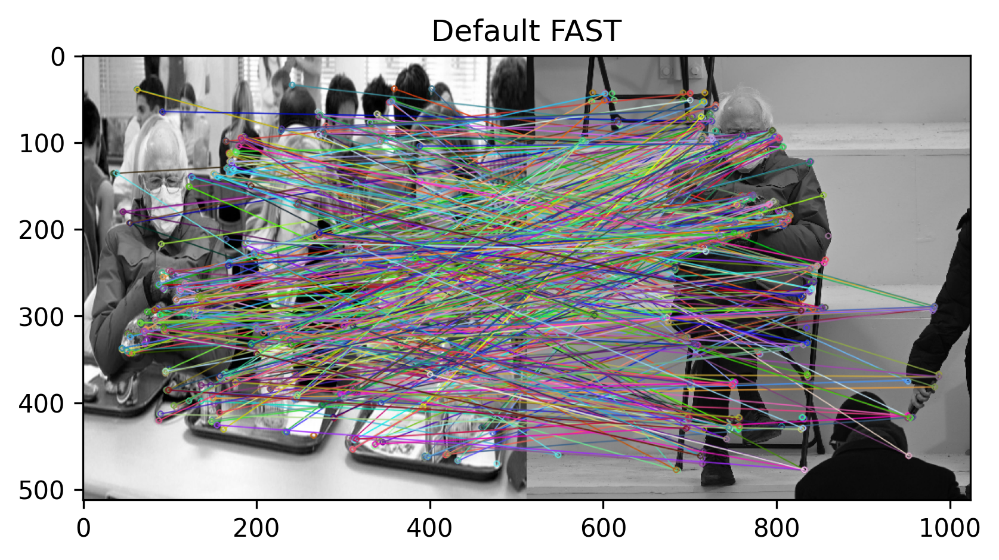

In [149]:
queryCustomKps, queryCustomDescriptors = createDefaultOrb(querySmall, cv2.ORB_FAST_SCORE)
matches = RatioFeatureMatcher(queryCustomDescriptors, defaultFastDescriptors, 0.98)
img = cv2.drawMatches(querySmall, queryCustomKps, small, defaultFastKps, matches, None)
plt.title("Default FAST")
plt.imshow(img)
plt.show

# Report Questions
## Parameters
### R response factor threshold
R threshold is found by scaling maximum R response found in image. 0.03 seems to be the best, judging from the graph of number of features.

### Ratio threshold
This is the percentage of bestDist/secondBestDist that is deemed too close. Choosing a value that is too low will cause many ambiguous matches. From my experiments, value of 0.98 seemed good enough to stop matching of features that are clustered together, as default ORB Harris tended to find a lot of features for same corner area.

## Which local features are best
The best local features are the corners in the embroidery (pattern) of the mittens/gloves of Bernie. They are usually the ones that get matched very well. They are very unique, producing very distinctive gradient orientations within a small patch, that are unlikely to naturally occur in the background of the other images, so those features are only found on cut-out of bernie, not in any other feature found in query picture.

## Harris vs FAST
Harris is more accurate, finding features that are more stable, meaning they are more invariant to intensity, translation etc changes. FAST yields a lot of false positives when noise is involved such as bernieNoisy2 benchmark picture, producing features made out of noise, which are useless. Although we can correct for noise by smoothing first. FAST also tends to produce features that are very clustered, close to each other and have little difference, this is probably due to classical FAST not supporting Non-Maxima suppression. Although the difference on this particular is small, Harris detected features in 0.5s and FAST finished in 0.4s, so it is indeed faster, making it more suited for real-time tasks. Overall, for this use case of offline processing Harris would be better.